In [1]:
import numpy as np 
import pandas as pd 
import re
import matplotlib.pyplot as plt
import seaborn as sns
sns.set_style("whitegrid"); 
plt.rcParams['figure.dpi'] = 360  
from wordcloud import WordCloud 
import spacy
from spacy.lang.en import English 
nlp = English() 
from collections import Counter 
import random
from essential_generators import DocumentGenerator

%matplotlib inline

In [2]:
# DATASET GENERATOR
gen = DocumentGenerator()
def gen_rating():
    return random.randrange(5000)
def gen_age():
    return random.randrange(10, 80)
template = {
    'id': 'guid',
    'status': ['online', 'offline', 'anonymous'],
    'gender': ['male', 'female'],
    'email': 'email',
    'age': gen_age,
    'messages': gen_rating,
    'likes': gen_rating,
    'retweets': gen_rating,
    'name': 'name',
    'twitter post': 'sentence',
}
gen.set_template(template)
documents = gen.documents(50000)
tw = pd.DataFrame(documents)
tw = tw.set_index('id')

In [3]:
tw.head()

,status,gender,email,age,messages,likes,retweets,name,twitter post
id,,,,,,,,,
40982daa-752d-486b-bd5f-9235da36dea7,online,female,butric@Linexp.co.uk,27,771,1218,2975,A Eximin,Era really Monument in Lower Manhattan. In add...
1b5d5368-80ef-42b2-b188-17cd101c6703,online,female,le@ited.fr,53,1367,927,3282,Ultion Dured,"Trafficante, Jr., Manufacturing, printing, pub..."
29f9c204-2609-495b-93d2-6a80afd82d8d,offline,female,to@Hists.biz,69,173,2968,1638,Orly The,"Abroad, mainly northwest. Canada"
79124ede-18bb-4b86-b2a5-1718f5a8e74f,anonymous,female,abottl.Fort@le.jp,26,3841,1474,3083,Darict The,"Labels on Haarlems Dagblad has appeared with ""..."
3eef8c05-e913-4ffe-bd34-9fe6379691f3,online,male,astrom@Couthe.net,31,1856,1946,162,Rentio Launis,Calcutta. Wundt through both social and


In [4]:
tw.describe()

,age,messages,likes,retweets
count,50000.000000,50000.000000,50000.000000,50000.000000
mean,44.448980,2509.017060,2490.928500,2502.793640
std,20.218042,1444.526537,1442.227193,1448.175961
min,10.000000,0.000000,0.000000,0.000000
25%,27.000000,1257.000000,1243.000000,1246.000000
50%,44.000000,2516.500000,2485.000000,2504.000000
75%,62.000000,3763.000000,3742.000000,3761.000000
max,79.000000,4999.000000,4999.000000,4999.000000


In [5]:
# FUCTIONS
def femalegroups(i1,i2):
    df = tw
    df = df[df.gender == 'female']
    return df

def malegroups(i1,i2):
    df = tw
    df = df[df.gender == 'male']
    return df

def string(group):
    tweet_string = " ".join(tweet for tweet in group["twitter post"])
    tweet_string = tweet_string.lower()
    tweet_string = re.sub(r'\s+',' ', tweet_string)
    return tweet_string

def cloud(group):
    wordcloud = WordCloud(background_color='white', max_words=50).generate(group)
    plt.imshow(wordcloud, interpolation='bilinear')
    plt.axis("off")
    plt.show()

#for saving
def cloudsave(group,filename):
    wordcloud = WordCloud(background_color='white', max_words=50).generate(group)
    plt.imshow(wordcloud, interpolation='bilinear')
    plt.axis("off")
    plt.savefig(filename)
    plt.show()
    
def barplot(group,name):
    nlp.max_length = 2000000
    tweet_doc = nlp(group)
    tweet_words = [token.text for token in tweet_doc if token.is_punct != True and token.is_stop != True]
    tweet_word_freq = Counter(tweet_words)
    # re-create the Pandas dataframe containing the 
    # tokens (words) and their frequencies
    freq_df = pd.DataFrame.from_dict(tweet_word_freq, orient='index').reset_index()
    freq_df.columns=["word", "freq"]
    fig, ax = plt.subplots(figsize=(12,6))
    sns.barplot(data=freq_df.sort_values(by="freq", ascending=False).head(25), 
            y="word", 
            x="freq", 
            color='#7bbcd5')
    plt.ylabel("Word")
    plt.xlabel("Frequency")
    plt.title("Top 25 Most Frequent Words for "+name)
    plt.xticks([0,210,420])
    sns.despine();

In [6]:
# GROUP CREATION

teenf = femalegroups(10,19)
twf = femalegroups(20,29)
thrf = femalegroups(30,39)
forf = femalegroups(40,49)
fiff = femalegroups(50,59)
sixf = femalegroups(60,69)
sevf = femalegroups(70,79)

teenm = malegroups(10,19)
twm = malegroups(20,29)
thrm = malegroups(30,39)
form = malegroups(40,49)
fifm = malegroups(50,59)
sixm = malegroups(60,69)
sevm = malegroups(70,79)

In [7]:
# STRINGS

teen_female = string(teenf)
twenties_female = string(twf)
thirties_female = string(thrf)
fourties_female = string(forf)
fifties_female = string(fiff)
sixties_female = string(sixf)
seventies_female = string(sevf)

teen_male = string(teenm)
twenties_male = string(twm)
thirties_male = string(thrm)
fourties_male = string(form)
fifties_male = string(fifm)
sixties_male = string(sixm)
seventies_male = string(sevm)

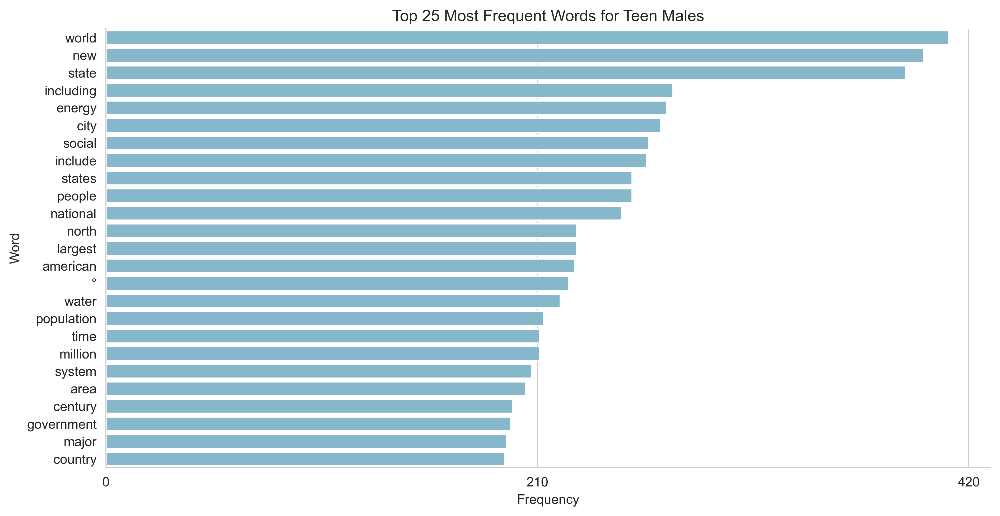

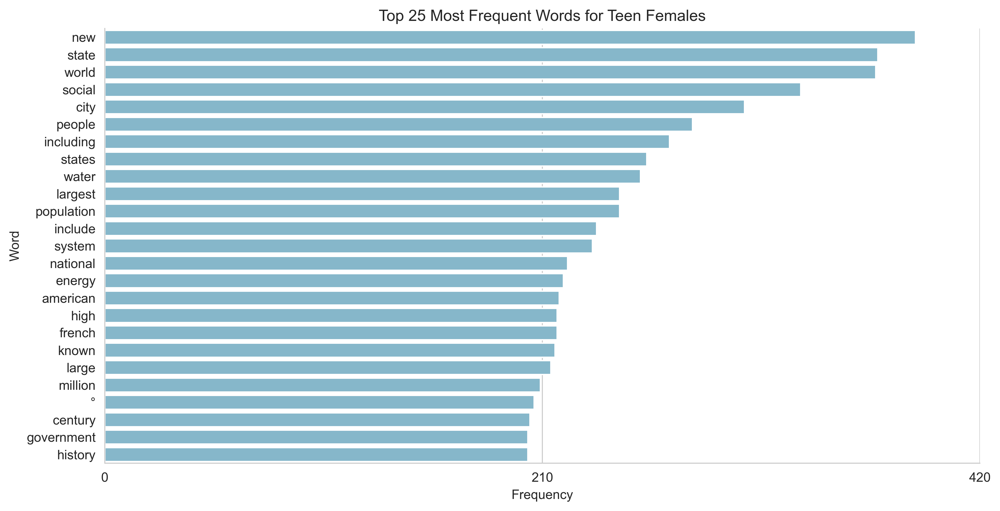

In [8]:
#CHECK TEEN MALE AND FEMALE
barplot(teen_male,'Teen Males')
barplot(teen_female, 'Teen Females')

In [9]:
fgroup = {'Teen females' : teen_female,
          'Females in their 20s': twenties_female, 
          'Females in their 30s': thirties_female,
          'Females in their 40s': fourties_female,
          'Females in their 50s': fifties_female,
          'Females in their 60s': sixties_female,
          'Females in their 70s': seventies_female
         }

mgroup = {'Teen males' : teen_male,
          'Males in their 20s': twenties_male, 
          'Males in their 30s': thirties_male,
          'Males in their 40s': fourties_male,
          'Males in their 50s': fifties_male,
          'Males in their 60s': sixties_male,
          'Males in their 70s': seventies_male
         }

Teen females


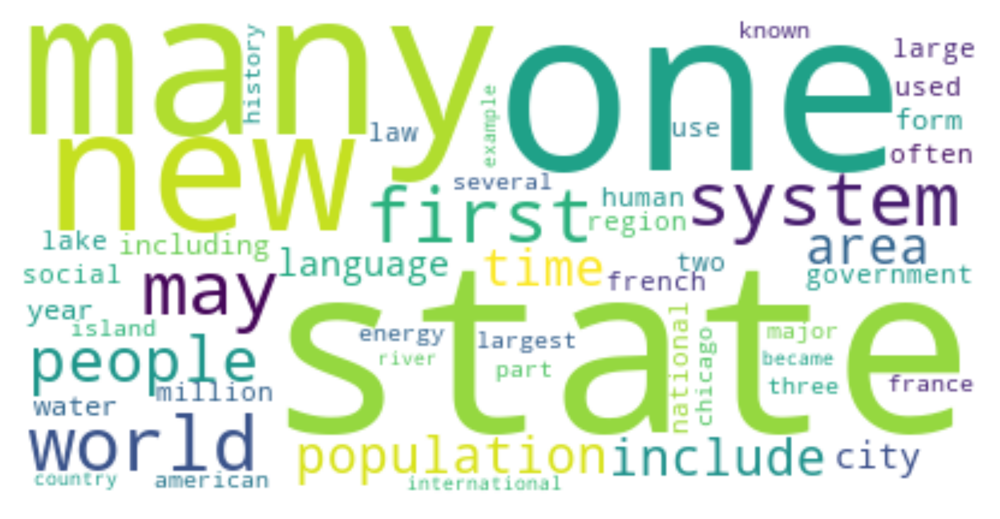

Females in their 20s


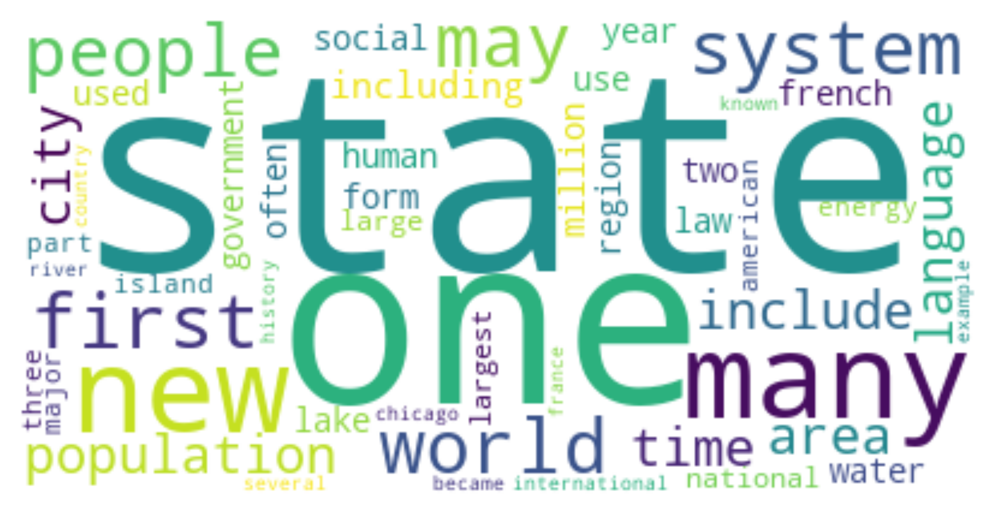

Females in their 30s


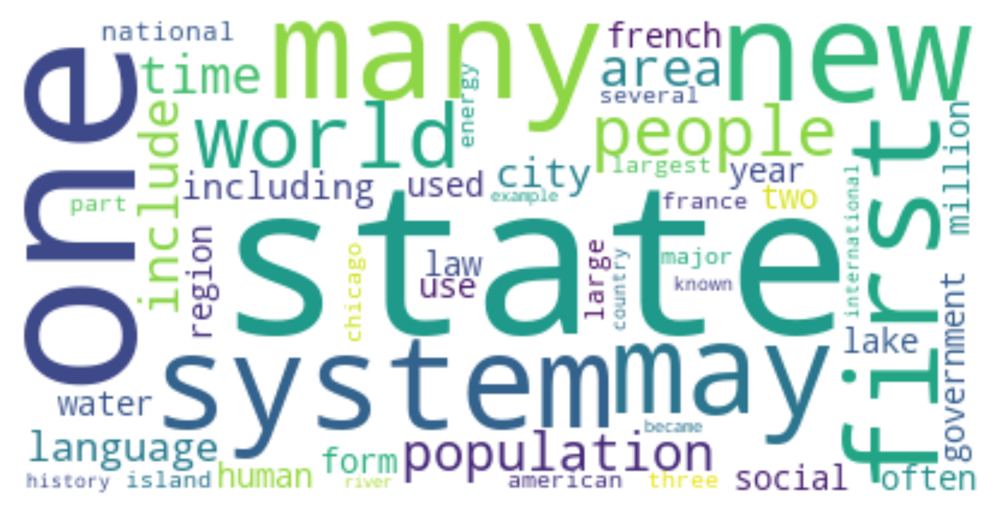

Females in their 40s


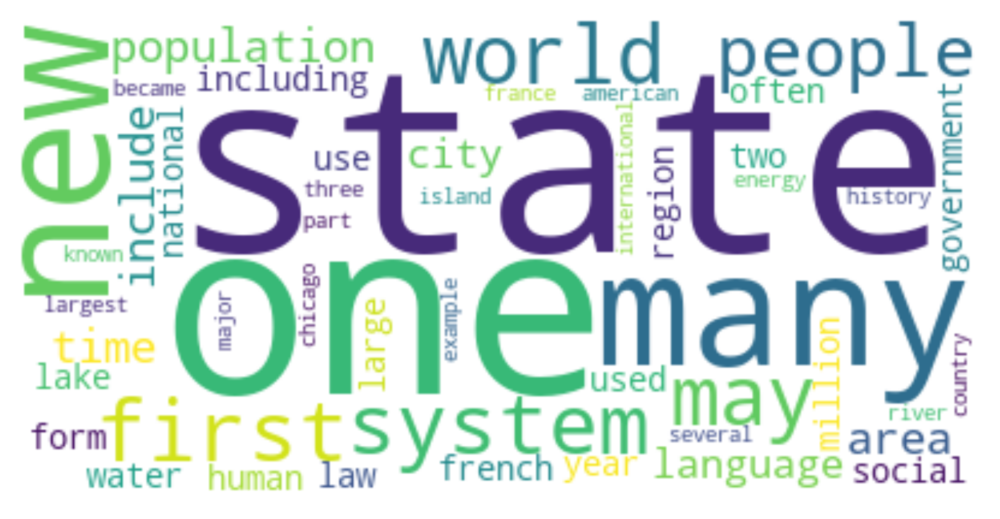

Females in their 50s


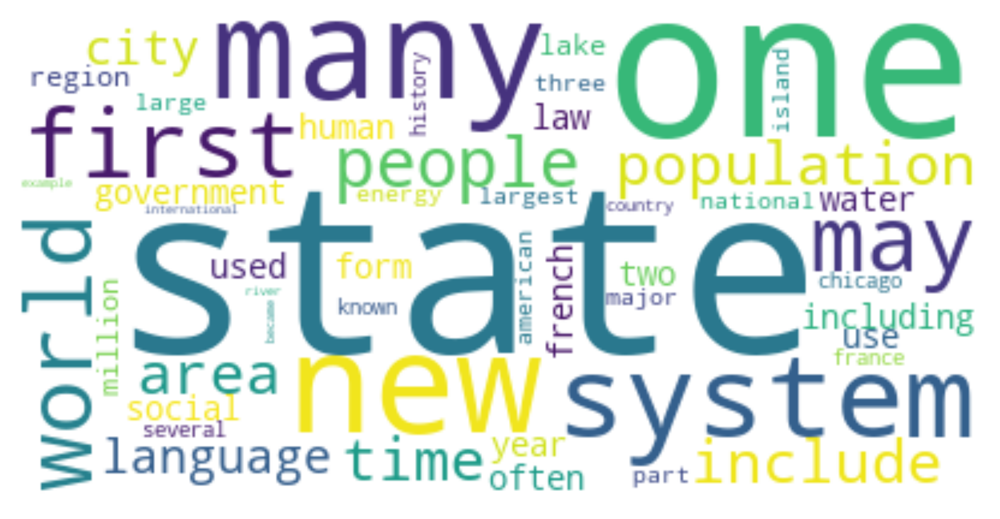

Females in their 60s


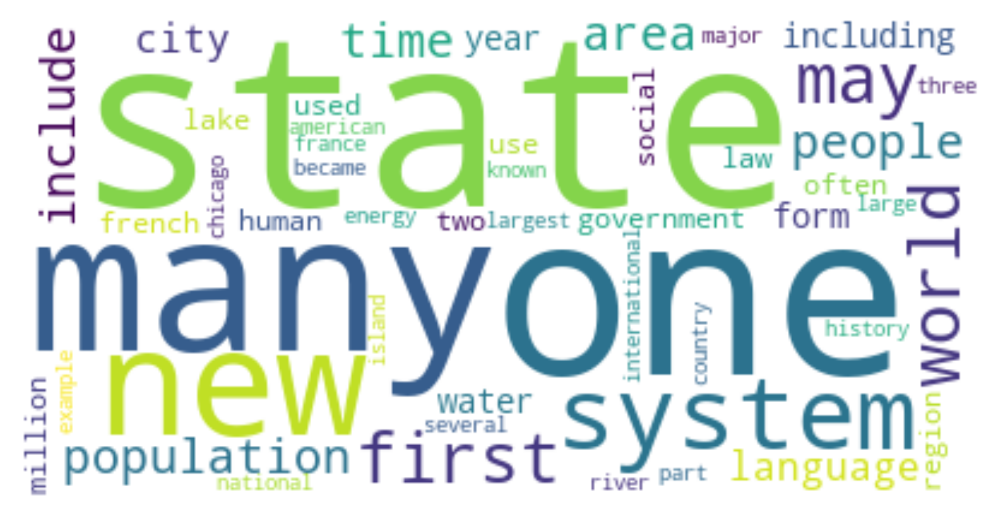

Females in their 70s


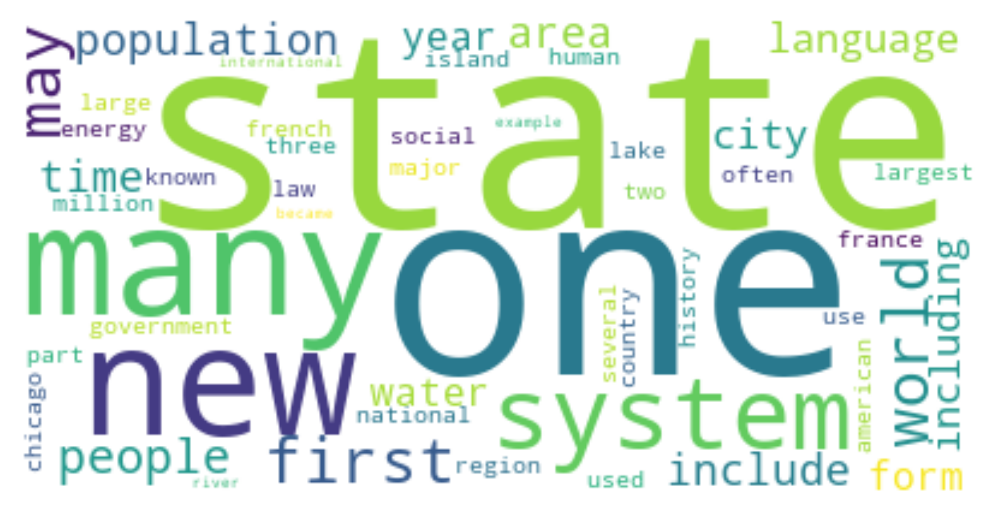

In [10]:
# Female group

for key, value in fgroup.items():
    print(key)
    cloud(value)

Teen males


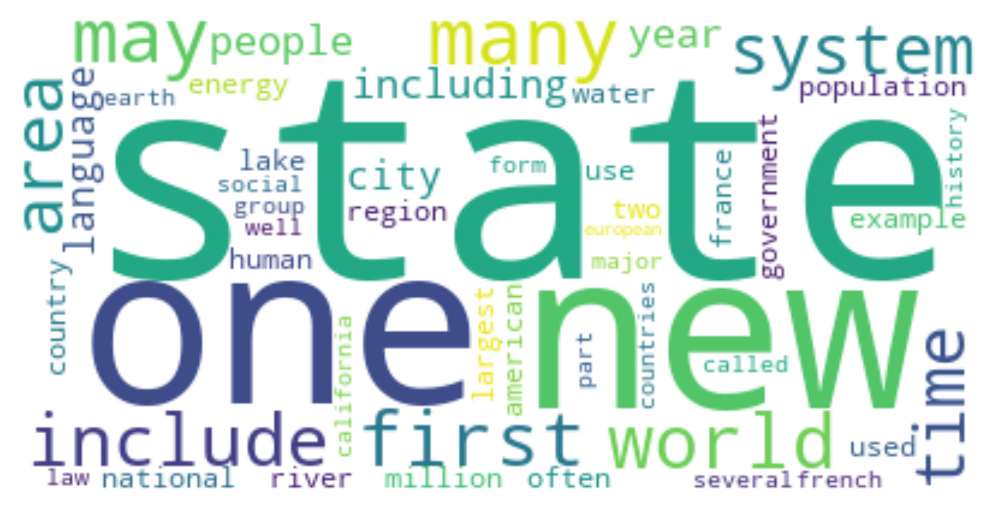

Males in their 20s


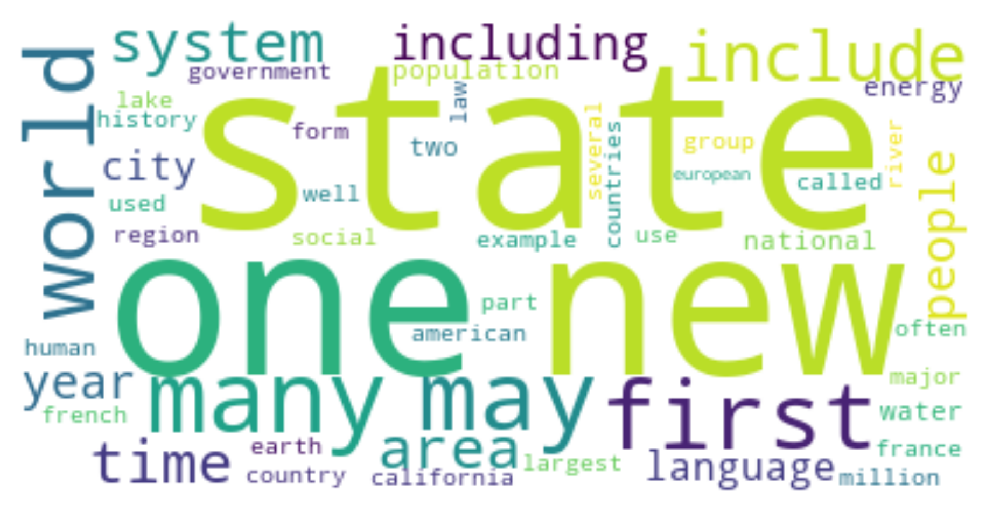

Males in their 30s


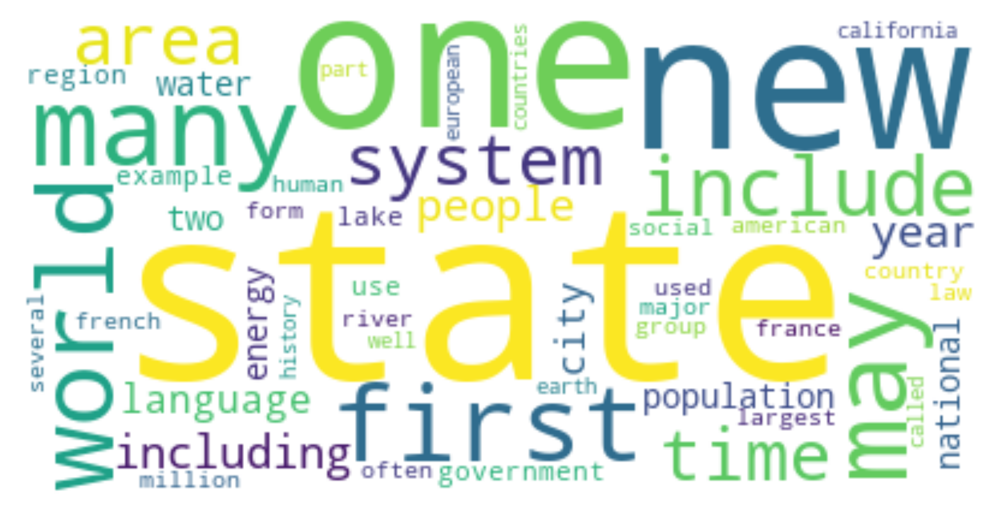

Males in their 40s


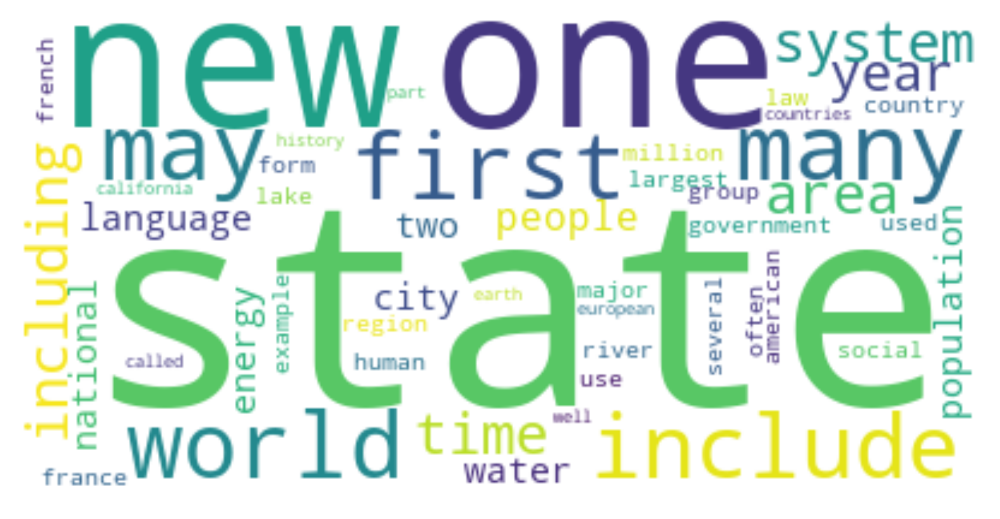

Males in their 50s


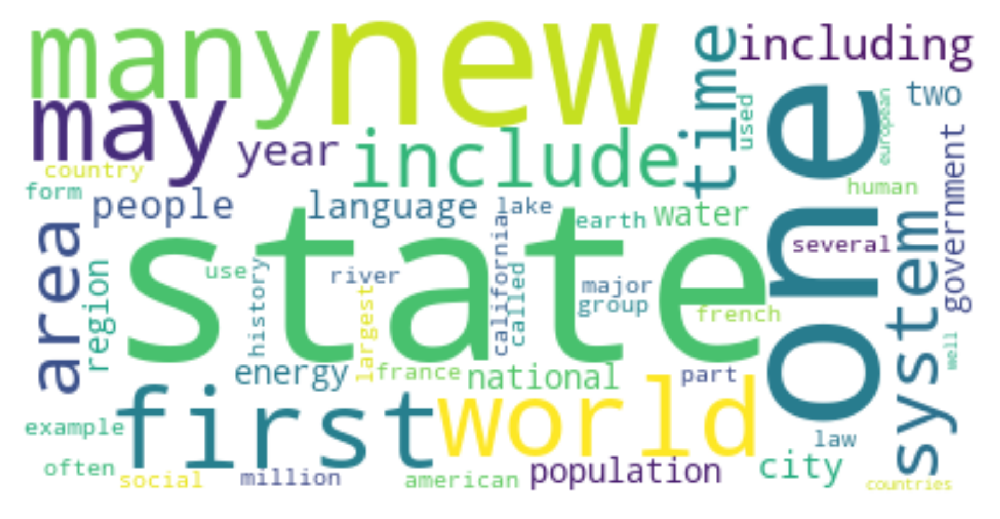

Males in their 60s


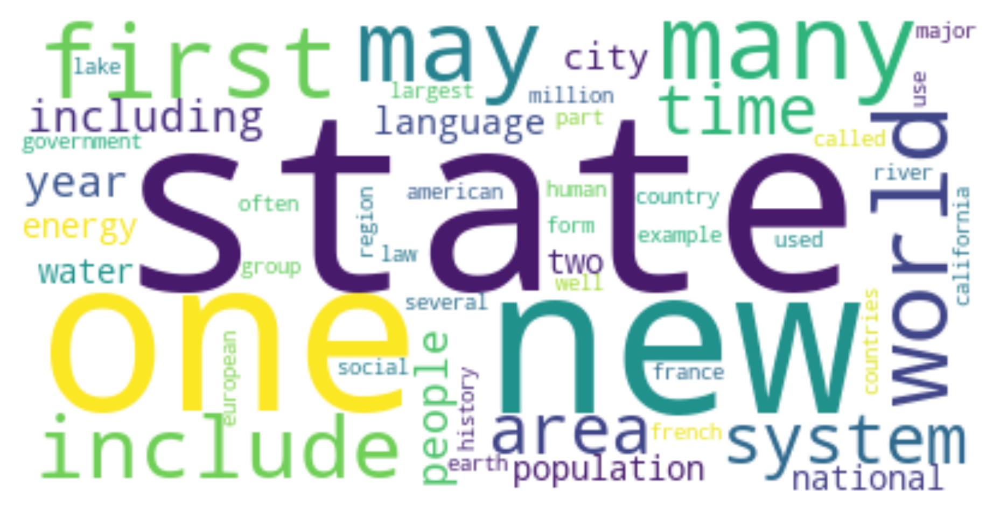

Males in their 70s


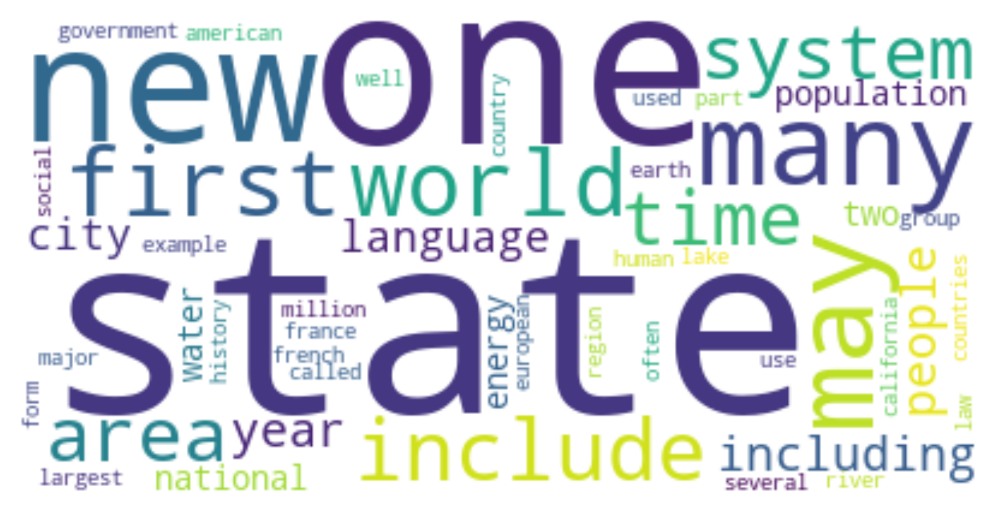

In [11]:
# Male group
for key, value in mgroup.items():
    print(key)
    cloud(value)